# 1. Linear Regression with Scikit Learn - Machine Learning with Python

The following topics are covered in this course:

* A typical problem statement for machine learning
* Downloading and exploring a dataset for machine learning
* Linear regression with one variable using Scikit-learn
* Linear regression with multiple variables
* Using categorical features for machine learning
* Regression coefficients and feature importance
* Other models and techniques for regression using Scikit-learn
* Applying linear regression to other datasets

This `course takes a practical and coding-focused approach`. We'll define the terms machine learning and linear regression in the context of a problem, and later generalize their definitions. We'll work through a typical machine learning problem step-by-step

`QUESTION:` ACME Insurance Inc. offers affordable health insurance to thousands of customer all over the United States. As the lead data scientist at ACME, you're tasked with creating an automated system to estimate the annual medical expenditure for new customers, using information such as their age, sex, BMI, children, smoking habits and region of residence.

Estimates from your system will be used to determine the annual insurance premium (amount paid every month) offered to the customer. Due to regulatory requirements, you must be able to explain why your system outputs a certain prediction.

You're given a `CSV file` containing verified historical data, consisting of the aforementioned information and the actual medical charges incurred by over 1300 customers.

In [481]:
#Lets downlaod the dataset
from urllib.request import urlretrieve
url = "https://raw.githubusercontent.com/JovianML/opendatasets/master/data/medical-charges.csv"
urlretrieve(url,'medical.csv')


('medical.csv', <http.client.HTTPMessage at 0x7cd505d276e0>)

In [482]:
#Lets load the dataset.
import pandas as pd
df = pd.read_csv("medical.csv")
df.head(10)

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520
5,31,female,25.740,0,no,southeast,3756.62160
6,46,female,33.440,1,no,southeast,8240.58960
7,37,female,27.740,3,no,northwest,7281.50560
8,37,male,29.830,2,no,northeast,6406.41070
9,60,female,25.840,0,no,northwest,28923.13692


In [483]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   charges   1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB


In [484]:
 df.describe()

,age,bmi,children,charges
count,1338.000000,1338.000000,1338.000000,1338.000000
mean,39.207025,30.663397,1.094918,13270.422265
std,14.049960,6.098187,1.205493,12110.011237
min,18.000000,15.960000,0.000000,1121.873900
25%,27.000000,26.296250,0.000000,4740.287150
50%,39.000000,30.400000,1.000000,9382.033000
75%,51.000000,34.693750,2.000000,16639.912515
max,64.000000,53.130000,5.000000,63770.428010


In [485]:
#import dependencies
import plotly.express as px
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

# These params will improve default presentations of our plots
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

In [486]:
#Focus on the age column
df.age.describe()

count    1338.000000
mean       39.207025
std        14.049960
min        18.000000
25%        27.000000
50%        39.000000
75%        51.000000
max        64.000000
Name: age, dtype: float64

In [487]:
#Lets plot a box plot of age
count,bin_edges = np.histogram(df['age'])
fig = px.histogram(
    df,
    x='age',
    marginal='box',
    nbins=len(bin_edges) - 1,
    title="Age Distribution."
)
fig.update_layout(bargap=0.1)
fig.show()

In [488]:
#Lets plot a box plot of age
count,bin_edges = np.histogram(df['bmi'])
fig = px.histogram(
    df,
    x='bmi',
    marginal='box',
    nbins=len(bin_edges) - 1,
    title="BMI Distribution."
)
fig.update_layout(bargap=0.1)
fig.show()

In [489]:
#Let's look at the charges for smokers and non-smokers.
fig = px.histogram(
    df,
    x='charges',
    marginal='box',
    color='smoker',
    color_discrete_sequence=['red','green'],
    title="Annual Medical charges for smokers and non-smokers"
)

fig.update_layout(bargap=0.1)
fig.show()

In [490]:
#Let's look at the charges for males and females.
fig = px.histogram(
    df,
    x='charges',
    marginal='box',
    color='sex',
    color_discrete_sequence=['purple','green'],
    title="Annual Medical charges for males and females."
)

fig.update_layout(bargap=0.1)
fig.show()

In [491]:
#Let's look at the charges for males and females.
fig = px.histogram(
    df,
    x='charges',
    marginal='box',
    color='region',
    color_discrete_sequence=['purple','green','orange','grey'],
    title="Annual Medical charges for males and females."
)

fig.update_layout(bargap=0.1)
fig.show()

In [492]:
#Let's compute correlation.
df_num = df[['age','bmi', 'children','charges']]
df_num.corr()

,age,bmi,children,charges
age,1.000000,0.109272,0.042469,0.299008
bmi,0.109272,1.000000,0.012759,0.198341
children,0.042469,0.012759,1.000000,0.067998
charges,0.299008,0.198341,0.067998,1.000000


In [493]:
df.columns

Index(['age', 'sex', 'bmi', 'children', 'smoker', 'region', 'charges'], dtype='object')

Text(0.5, 1.0, 'Correlation Matrix')

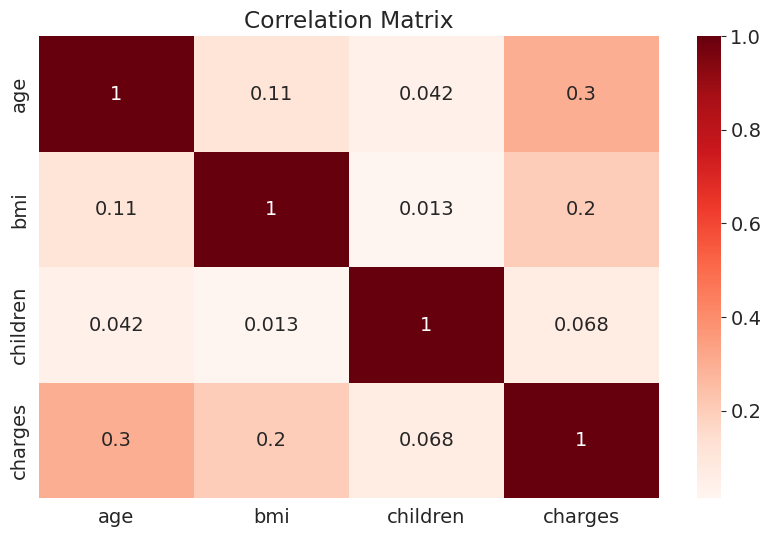

In [500]:
#Lets plot a heatmap
sns.heatmap(df_num.corr(),cmap="Reds",annot=True)
plt.title("Correlation Matrix")

## 1.1. Understanding the concept of Regression.

In [503]:
non_smoker = df[df.smoker=='no']
non_smoker

,age,sex,bmi,children,smoker,region,charges
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520
5,31,female,25.740,0,no,southeast,3756.62160
...,...,...,...,...,...,...,...
1332,52,female,44.700,3,no,southwest,11411.68500
1333,50,male,30.970,3,no,northwest,10600.54830
1334,18,female,31.920,0,no,northeast,2205.98080
1335,18,female,36.850,0,no,southeast,1629.83350


<Axes: title={'center': 'Age vs Charges.'}, xlabel='age', ylabel='charges'>

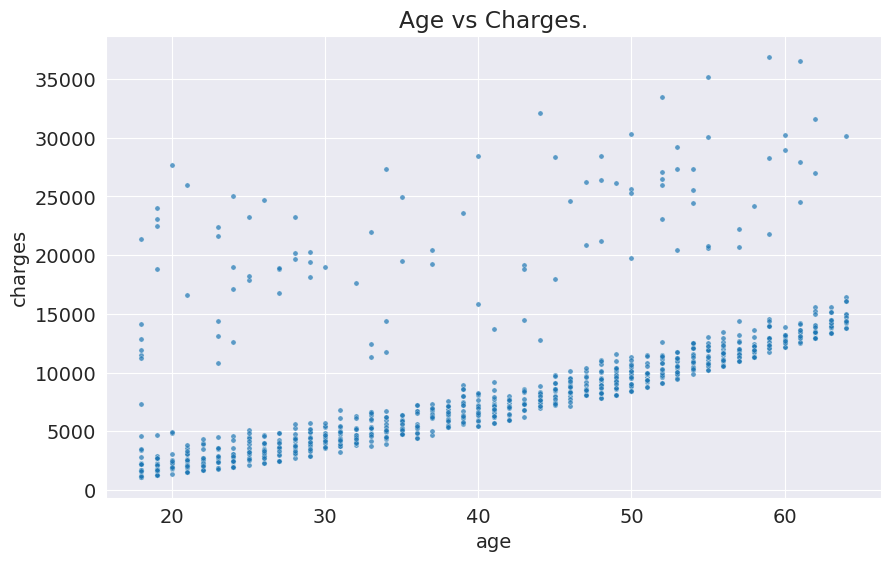

In [505]:
#Also let's plot the relationship between charges and age for non-smokers
plt.title("Age vs Charges.")
sns.scatterplot(data=non_smoker,x='age',y='charges',alpha=0.7,s=14)

In the above case, the x axis shows "age" and the y axis shows "charges". Thus, we're assuming the following relationship between the two:


charges=w×age+b

We'll try determine 
w
w and 
b
b for the line that best fits the data.

This technique is called linear regression, and we call the above equation a linear regression model, because it models the relationship between "age" and "charges" as a straight line.

The numbers 
w
w and 
b
b are called the parameters or weights of the model.

The values in the "age" column of the dataset are called the inputs to the model and the values in the charges column are called "targets".

In [507]:
def estimate_charges(age,w,b):
    return w*age + b

#Assume
age=10
w = 50
b=100
estimate_charges(w,age,b)

600

In [510]:
non_smoker_ages = non_smoker.age
non_smoker_ages

1       18
2       28
3       33
4       32
5       31
        ..
1332    52
1333    50
1334    18
1335    18
1336    21
Name: age, Length: 1064, dtype: int64

In [511]:
#Estimated charges
estimated_charges = estimate_charges(non_smoker_ages,w,b)
estimated_charges

1       1000
2       1500
3       1750
4       1700
5       1650
        ... 
1332    2700
1333    2600
1334    1000
1335    1000
1336    1150
Name: age, Length: 1064, dtype: int64

Text(0, 0.5, 'Charges')

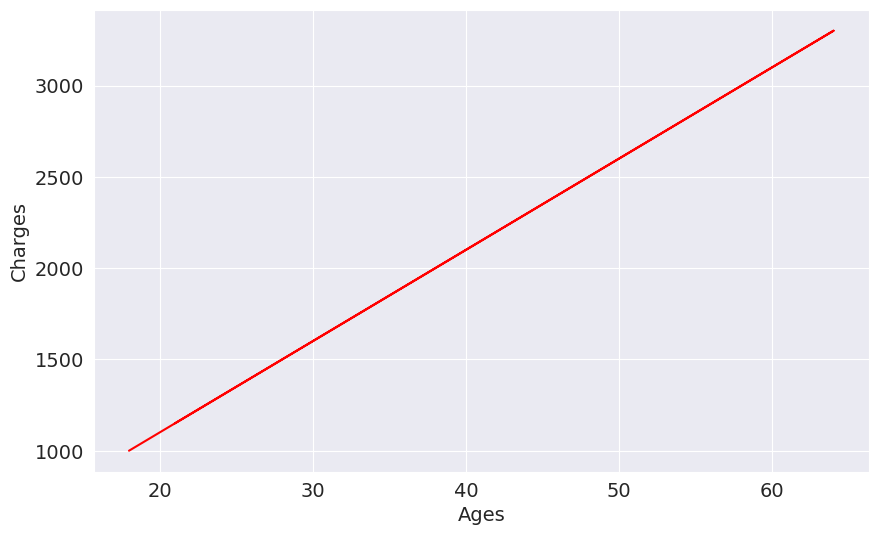

In [512]:
plt.plot(non_smoker_ages,estimated_charges, c='r')
plt.xlabel("Ages")
plt.ylabel("Charges")

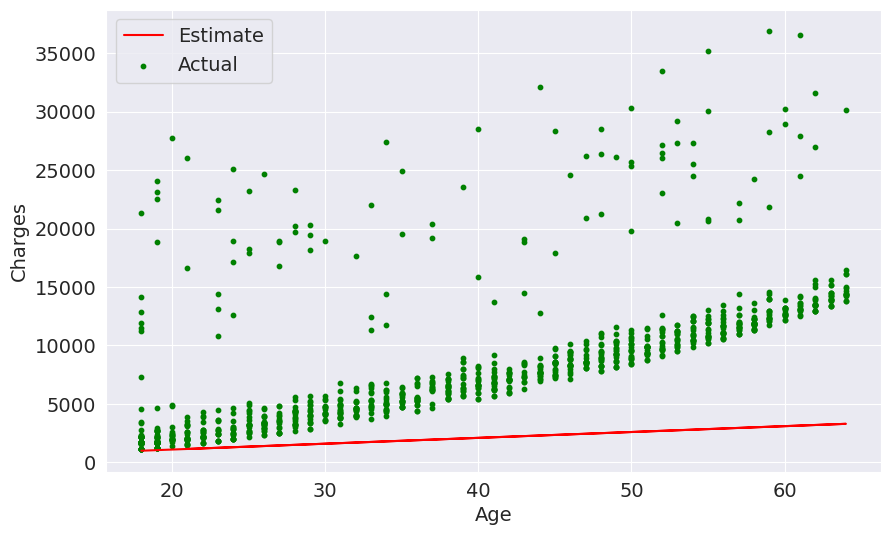

In [513]:
#Now let's try to predict charges for non-smokers
target = non_smoker.charges
plt.plot(non_smoker_ages,estimated_charges, c='r')
plt.scatter(non_smoker_ages,target,c='g',marker='o',s=10)
plt.xlabel('Age');
plt.ylabel('Charges')
plt.legend(['Estimate', 'Actual']);

In [514]:
#fitting the line of best fit
def try_parameters(w, b):
    ages = non_smoker.age
    target = non_smoker.charges
    
    estimated_charges = estimate_charges(ages, w, b)
    
    plt.plot(ages, estimated_charges, 'r', alpha=0.9);
    plt.scatter(ages, target, s=8,alpha=0.8);
    plt.xlabel('Age');
    plt.ylabel('Charges')
    plt.legend(['Estimate', 'Actual']);

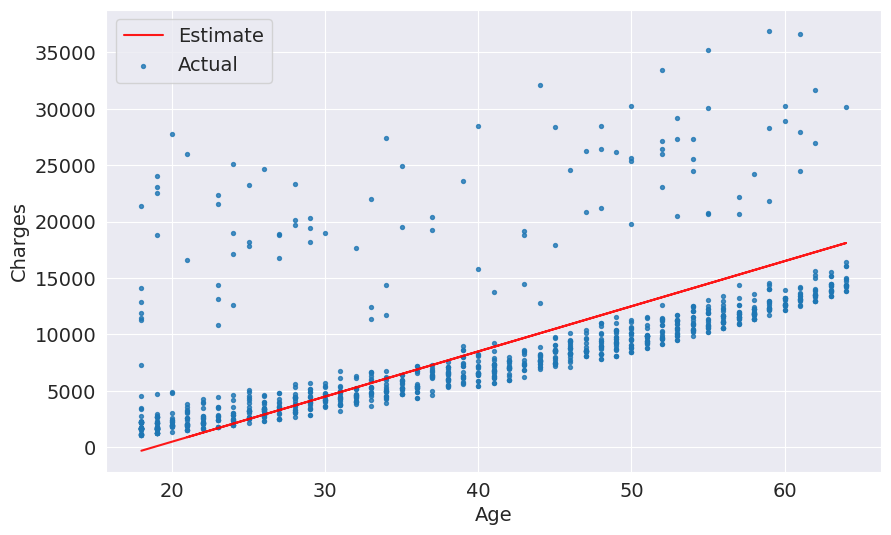

In [515]:
#We keep trying the parameters until we findthe best fit.
try_parameters(400,-7500)

In [516]:
targets = non_smoker.charges
targets

1        1725.55230
2        4449.46200
3       21984.47061
4        3866.85520
5        3756.62160
           ...     
1332    11411.68500
1333    10600.54830
1334     2205.98080
1335     1629.83350
1336     2007.94500
Name: charges, Length: 1064, dtype: float64

In [517]:
predictions = estimated_charges
predictions

1       1000
2       1500
3       1750
4       1700
5       1650
        ... 
1332    2700
1333    2600
1334    1000
1335    1000
1336    1150
Name: age, Length: 1064, dtype: int64

**Loss/Cost Function**

We can compare our model's predictions with the actual targets using the following method:

* Calculate the difference between the targets and predictions (the differenced is called the "residual")
* Square all elements of the difference matrix to remove negative values.
* Calculate the average of the elements in the resulting matrix.
* Take the square root of the result

In [522]:
#Lets compute the Residual Means Squared Error (RMSE) to understand the distance btn the predictions and the actual charges.
import numpy as np
def rmse(targets,predictions):
    return np.sqrt(np.mean(np.square(targets - predictions)))

Let's compute the RMSE for our model with a sample set of weights



In [524]:
w = 50
b = 100

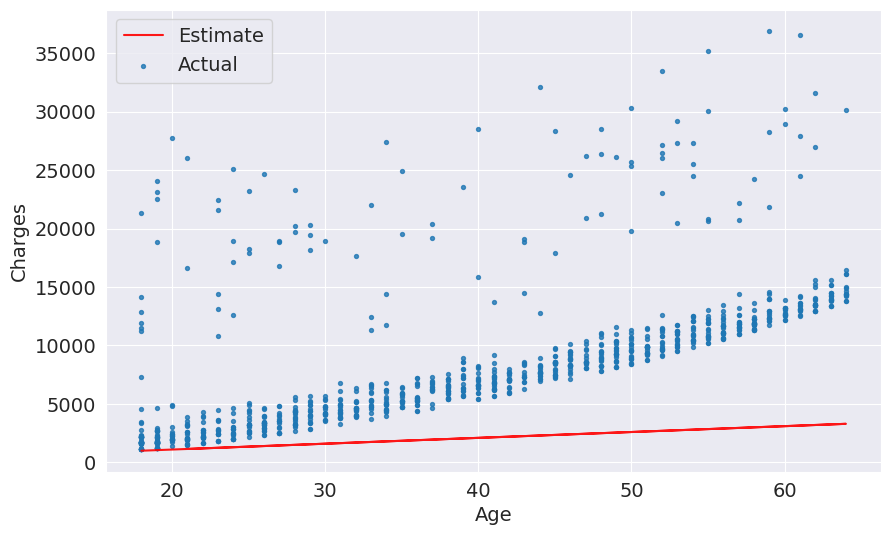

In [525]:
try_parameters(w, b)

In [526]:
targets = non_smoker['charges']
predicted = estimate_charges(non_smoker.age, w, b)

In [527]:
rmse(targets,predicted)

8461.949562575493

In [530]:
def try_parameters(w, b):
    ages = non_smoker.age
    target = non_smoker.charges
    predictions = estimate_charges(ages, w, b)
    
    plt.plot(ages, predictions, 'r', alpha=0.9);
    plt.scatter(ages, target, s=8,alpha=0.8);
    plt.xlabel('Age');
    plt.ylabel('Charges')
    plt.legend(['Prediction', 'Actual']);
    
    loss = rmse(target, predictions)
    print("RMSE Loss: ", loss)

RMSE Loss:  4818.589201659388


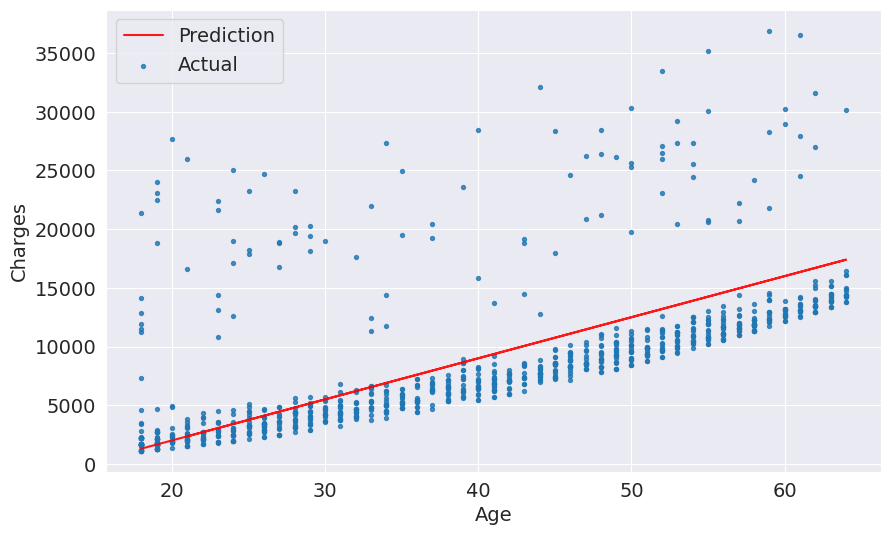

In [531]:
try_parameters(350, -5000)

## 1.2. Linear Regression.

Let's now try to use machine learning to do the same process.

In [538]:
#Import scikit learn
from sklearn.linear_model import LinearRegression

In [539]:
#Create a model object
model = LinearRegression()

In [541]:
#Let's prepare inputs and targets
non_smokers_df = df[df['smoker']=='no']
inputs = non_smokers_df[['age']] # We are selecting the age this way to ensure its a Dtaframe not a Series.
targets = non_smokers_df.charges
print(inputs.shape)
print(targets.shape)

(1064, 1)
(1064,)


In [542]:
#Let's run our linear regression model and fit the data.
model.fit(inputs,targets)

LinearRegression()

We can now make predictions using the model. Let's try predicting the charges for the ages 23, 37 and 61

In [546]:
model.predict(
    np.array([
    [23],
    [37],
    [61]
    ])
)

/home/lenny/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



array([ 4055.30443855,  7796.78921819, 14210.76312614])

In [547]:
#Lets predict charges for the rest of the inputs
targets = non_smoker['charges']
predictions = model.predict(inputs)
print(predictions)
print(targets)

[2719.0598744  5391.54900271 6727.79356686 ... 2719.0598744  2719.0598744
 3520.80661289]
1        1725.55230
2        4449.46200
3       21984.47061
4        3866.85520
5        3756.62160
           ...     
1332    11411.68500
1333    10600.54830
1334     2205.98080
1335     1629.83350
1336     2007.94500
Name: charges, Length: 1064, dtype: float64


In [551]:
#Lets compute the RMSE
rmse(targets,predictions)

4662.505766636395

The parameters of the model are stored in `the coef_` and `intercept_` properties.

In [553]:
print('w:',model.coef_)
print('b:',model.intercept_)

w: [267.24891283]
b: -2091.4205565650827


Let's visualize the line created by the above parameters.



RMSE Loss:  4662.505766636395


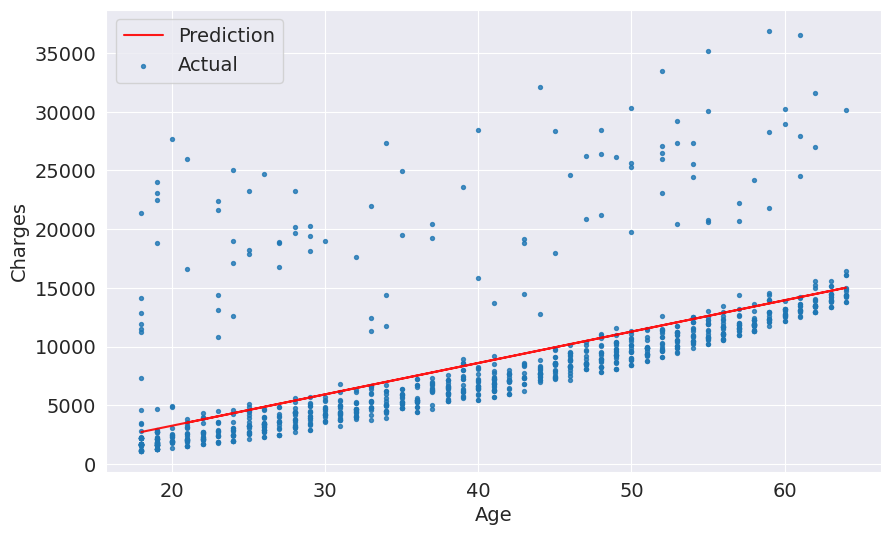

In [555]:
try_parameters(model.coef_,model.intercept_)

In [556]:
#Now we repeat the process to get the chages for non-smokers
#Let's prepare inputs and targets
smokers_df = df[df['smoker']=='yes']
inputs = smokers_df[['age']] # We are selecting the age this way to ensure its a Dtaframe not a Series.
targets = smokers_df.charges
print(inputs.shape)
print(targets.shape)

(274, 1)
(274,)


In [557]:
#Create a model object
model2 = LinearRegression()

In [558]:
#fitting our model with data
model2.fit(inputs,targets)

LinearRegression()

In [559]:
#Lets predict charges for the smokers
targets = smokers_df['charges']
predictions = model2.predict(inputs)
print(predictions)
print(targets)

[26093.642567   39218.85945773 28535.54338388 29451.25619021
 30672.20659865 29756.49379232 27009.35537333 28840.78098599
 30977.44420076 38608.38425351 31282.68180287 34945.53302819
 31282.68180287 37997.90904929 25788.40496489 36471.72103874
 26398.88016911 28840.78098599 28535.54338388 27009.35537333
 31587.91940498 34029.82022186 37692.67144718 38303.1466514
 39829.33466195 37387.43384507 31893.15700709 38913.62185562
 26398.88016911 39524.09705984 29146.0185881  33724.58261975
 26093.642567   30061.73139443 30672.20659865 29451.25619021
 34335.05782397 33114.10741553 34945.53302819 25788.40496489
 29451.25619021 33114.10741553 25788.40496489 39524.09705984
 31282.68180287 28535.54338388 30977.44420076 26093.642567
 33114.10741553 32503.63221131 26093.642567   27314.59297544
 39524.09705984 25788.40496489 39524.09705984 36776.95864085
 35556.00823241 37387.43384507 26093.642567   26398.88016911
 36166.48343663 26093.642567   34335.05782397 32503.63221131
 35556.00823241 32503.63221

In [560]:
#Lets compute the RMSE
rmse(targets,predictions)

10711.00334810241

In [561]:
print('w:',model.coef_)
print('b:',model.intercept_)

w: [267.24891283]
b: -2091.4205565650827


RMSE Loss:  4662.505766636395


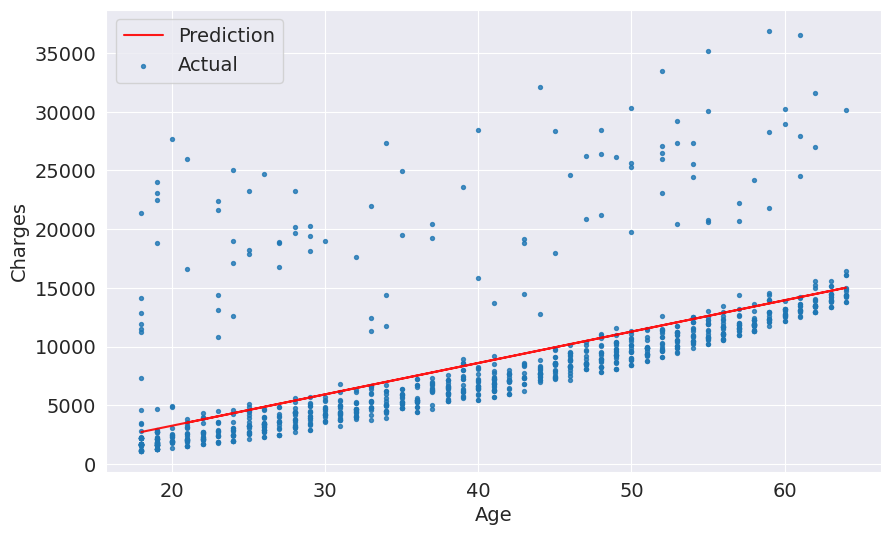

In [562]:
try_parameters(model.coef_,model.intercept_)

## 1.3. Multiple Linear Regression.

In [564]:
#Let's train our model on more than one features
from sklearn.linear_model import LinearRegression
inputs,targets = non_smoker[['age','bmi','children']],non_smoker['charges']
model = LinearRegression()
model.fit(inputs,targets)
predictions = model.predict(inputs)
loss = rmse(targets,predictions)
print(f"Loss:{loss}")

Loss:4608.470405038246


In [565]:
non_smoker.bmi.corr(non_smoker.charges)

0.08403654312833271

In [566]:
print('w:',model.coef_)
print('b:',model.intercept_)

w: [265.2938443    5.27956313 580.65965053]
b: -2809.2976032235892


RMSE Loss:  13280.244560494253


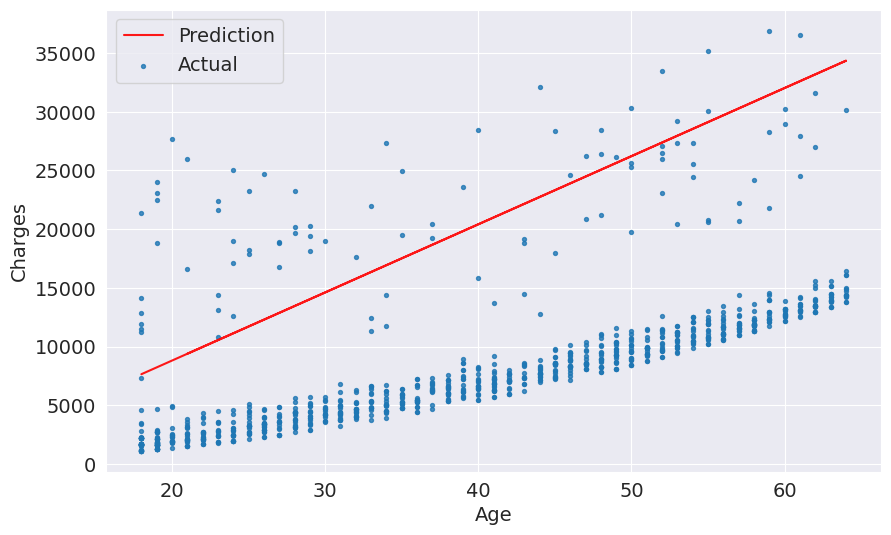

In [569]:
try_parameters(model.coef_[2],model.intercept_)

In [572]:
#Finallylets now train our model on all customers
from sklearn.linear_model import LinearRegression
inputs,targets = df[['age','bmi','children']],df['charges']
model = LinearRegression()
model.fit(inputs,targets)
predictions = model.predict(inputs)
loss = rmse(targets,predictions)
print(f"Loss:{loss}")

Loss:11355.317901125973


In [573]:
print('w:',model.coef_)
print('b:',model.intercept_)

w: [239.99447429 332.0833645  542.86465225]
b: -6916.243347787033


RMSE Loss:  8553.20826942616


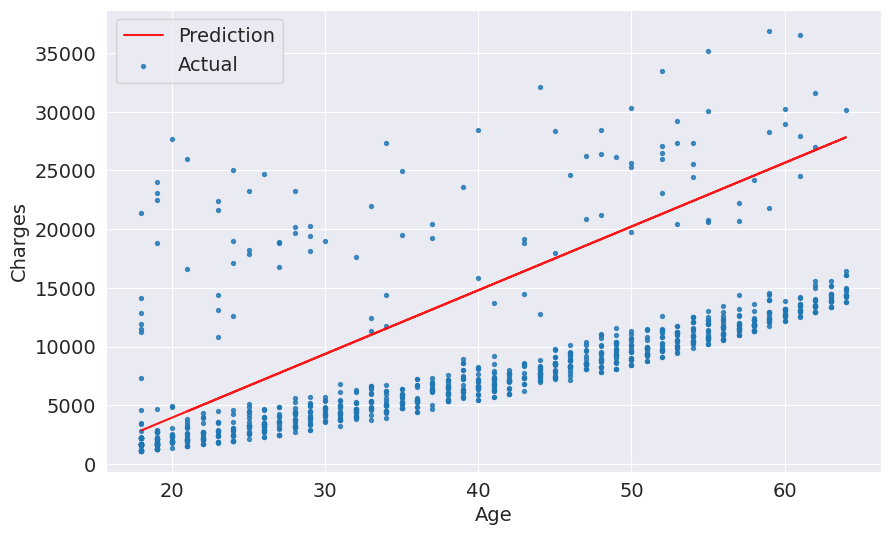

In [575]:
try_parameters(model.coef_[2],model.intercept_)

In [576]:
px.scatter(df,x='age',y='charges',color='smoker')

**Using Categorical Features for Machine Learning**

So far we've been using only numeric columns, since we can only perform computations with numbers. If we could use categorical columns like "smoker", we can train a single model for the entire dataset.

To use the categorical columns, we simply need to convert them to numbers.

There are three common techniques for doing this:

* If a categorical column has just two categories (it's called a binary category), then we can replace their values with 0 and 1.
* If a categorical column has more than 2 categories, we can perform one-hot encoding i.e. create a new column for each category with 1s and 0s.
* If the categories have a natural order (e.g. cold, neutral, warm, hot), then they can be converted to numbers (e.g. 1, 2, 3, 4) preserving the order. These are called ordinals

**Binary Categories**

In [579]:
#Let's conver the smioker column into numeric
smoker_codes = {'no':0,'yes':1}
df['smoker_codes'] = df.smoker.map(smoker_codes)
sex_codes  ={'male':0,'female':1}
df['sex_codes'] = df.sex.map(sex_codes)

In [580]:
df

,age,sex,bmi,children,smoker,region,charges,smoker_codes,sex_codes
0,19,female,27.900,0,yes,southwest,16884.92400,1,1
1,18,male,33.770,1,no,southeast,1725.55230,0,0
2,28,male,33.000,3,no,southeast,4449.46200,0,0
3,33,male,22.705,0,no,northwest,21984.47061,0,0
4,32,male,28.880,0,no,northwest,3866.85520,0,0
...,...,...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830,0,0
1334,18,female,31.920,0,no,northeast,2205.98080,0,1
1335,18,female,36.850,0,no,southeast,1629.83350,0,1
1336,21,female,25.800,0,no,southwest,2007.94500,0,1


In [582]:
df.charges.corr(df.smoker_codes)

0.7872514304984772

In [583]:
df.charges.corr(df.sex_codes)

-0.05729206220202542

In [584]:
#Again,Lets train ou model on all the datas and with multiple features
inputs,targets = df[['age','bmi','children','sex_codes','smoker_codes']],df['charges']
model=LinearRegression().fit(inputs,targets)
predictions = model.predict(inputs)
loss = rmse(predictions,targets)
print(f"Loss: {loss}")

Loss: 6056.100708754547


**One-hot Encoding**

In [587]:
from sklearn import preprocessing
enc = preprocessing.OneHotEncoder()
enc.fit(df[['region']])
enc.categories_

[array(['northeast', 'northwest', 'southeast', 'southwest'], dtype=object)]

In [588]:
one_hot = enc.transform(df[['region']]).toarray()
one_hot

array([[0., 0., 0., 1.],
       [0., 0., 1., 0.],
       [0., 0., 1., 0.],
       ...,
       [0., 0., 1., 0.],
       [0., 0., 0., 1.],
       [0., 1., 0., 0.]])

In [589]:
df[['northeast', 'northwest', 'southeast', 'southwest']] = one_hot


In [590]:
df

,age,sex,bmi,children,smoker,region,charges,smoker_codes,sex_codes,northeast,northwest,southeast,southwest
0,19,female,27.900,0,yes,southwest,16884.92400,1,1,0.0,0.0,0.0,1.0
1,18,male,33.770,1,no,southeast,1725.55230,0,0,0.0,0.0,1.0,0.0
2,28,male,33.000,3,no,southeast,4449.46200,0,0,0.0,0.0,1.0,0.0
3,33,male,22.705,0,no,northwest,21984.47061,0,0,0.0,1.0,0.0,0.0
4,32,male,28.880,0,no,northwest,3866.85520,0,0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830,0,0,0.0,1.0,0.0,0.0
1334,18,female,31.920,0,no,northeast,2205.98080,0,1,1.0,0.0,0.0,0.0
1335,18,female,36.850,0,no,southeast,1629.83350,0,1,0.0,0.0,1.0,0.0
1336,21,female,25.800,0,no,southwest,2007.94500,0,1,0.0,0.0,0.0,1.0


In [591]:
#We train again.
input_cols = ['age', 'bmi', 'children', 'smoker_codes', 'sex_codes', 'northeast', 'northwest', 'southeast', 'southwest']
inputs,targets  = df[input_cols],df['charges']
model=LinearRegression().fit(inputs,targets)
predictions = model.predict(inputs)
loss = rmse(predictions,targets)
print(f"Loss: {loss}")

Loss: 6041.6796511744515


In [592]:
weights_df = pd.DataFrame({
    'feature': np.append(input_cols, 1),
    'weight': np.append(model.coef_, model.intercept_)
})
weights_df

,feature,weight
0,age,256.856353
1,bmi,339.193454
2,children,475.500545
3,smoker_codes,23848.534542
4,sex_codes,131.314359
5,northeast,587.009235
6,northwest,234.045336
7,southeast,-448.012814
8,southwest,-373.041756
9,1,-12656.862171


While it seems like BMI and the "northeast" have a higher weight than age, keep in mind that the range of values for BMI is limited (15 to 40) and the "northeast" column only takes the values 0 and 1.

Because different columns have different ranges, we run into two issues:

We can't compare the weights of different column to identify which features are important
A column with a larger range of inputs may disproportionately affect the loss and dominate the optimization process.
For this reason, it's common practice to scale (or standardize) the values in numeric column by subtracting the mean and dividing by the standard deviation.

**Standardization**

In [595]:
from sklearn.preprocessing import StandardScaler

numeric_cols = ['age','bmi','children']
scaler = StandardScaler()
scaler.fit(df[numeric_cols])

StandardScaler()

In [596]:
scaler.mean_

array([39.20702541, 30.66339686,  1.09491779])

In [597]:
scaler.var_

array([197.25385199,  37.16008997,   1.45212664])

In [599]:
scaled_inputs = scaler.transform(df[numeric_cols])
scaled_inputs

array([[-1.43876426, -0.45332   , -0.90861367],
       [-1.50996545,  0.5096211 , -0.07876719],
       [-0.79795355,  0.38330685,  1.58092576],
       ...,
       [-1.50996545,  1.0148781 , -0.90861367],
       [-1.29636188, -0.79781341, -0.90861367],
       [ 1.55168573, -0.26138796, -0.90861367]])

In [601]:
cat_cols = ['smoker_codes', 'sex_codes', 'northeast', 'northwest', 'southeast', 'southwest']
categorical_data = df[cat_cols].values
categorical_data

array([[1., 1., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0.],
       ...,
       [0., 1., 0., 0., 1., 0.],
       [0., 1., 0., 0., 0., 1.],
       [1., 1., 0., 1., 0., 0.]])

In [602]:
inputs = np.concatenate((scaled_inputs,categorical_data),axis=1)
targets = df.charges
model = LinearRegression().fit(inputs,targets)
predictions = model.predict(inputs)
loss = rmse(targets,predictions)
print(f"Loss: {loss}")

Loss: 6041.6796511744515


In [605]:
weights_df = pd.DataFrame({
    'feature': np.append(numeric_cols + cat_cols, 1),
    'weight': np.append(model.coef_, model.intercept_)
})
weights_df.sort_values('weight', ascending=False)

,feature,weight
3,smoker_codes,23848.534542
9,1,8335.168856
0,age,3607.472736
1,bmi,2067.691966
5,northeast,587.009235
2,children,572.998210
6,northwest,234.045336
4,sex_codes,131.314359
8,southwest,-373.041756
7,southeast,-448.012814


As you can see now, the most important feature are:

* Smoker
* Age
* BMI

**Creating a Test Set**

Models like the one we've created in this tutorial are designed to be used in the real world. It's common practice to set aside a small fraction of the data (e.g. 10%) just for testing and reporting the results of the model.

In [690]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

inputs,targets = df[['age','bmi','smoker_codes']],df['charges']
inputs_train, inputs_test, targets_train, targets_test = train_test_split(inputs, targets, test_size=0.1)

model = LinearRegression().fit(inputs_train,targets_train)
predictions = model.predict(inputs_test)
loss = rmse(targets_test,predictions)
print(f"Loss: {loss}")

Loss: 5170.212293278887


**How to Approach a Machine Learning Problem**
    
Here's a strategy you can apply to approach any machine learning problem:

* Explore the data and find correlations between inputs and targets
* Pick the right model, loss functions and optimizer for the problem at hand
* Scale numeric variables and one-hot encode categorical data
* Set aside a test set (using a fraction of the training set)
* Train the model
* Make predictions on the test set and compute the loss

 ## Revision Questions
1.	Why do we have to perform EDA before fitting a model to the data?
2.	What is a parameter?
3.	What is correlation?
4.	What does negative correlation mean?
5.	How can you find correlation between variables in Python?
6.	What is causation? Explain difference between correlation and causation with an example.
7.	Define Linear Regression.
8.	What is univariate linear regression?
9.	What is multivariate linear regression?
10.	What are weights and bias?
11.	What are inputs and targets?
12.	What is loss/cost function?
13.	What is residual? 
14.	What is RMSE value? When and why do we use it?
15.	What is an Optimizer? What are different types of optimizers? Explain each with an example.
16.	What library is available in Python to perform Linear Regression?
17.	What is <code>sklearn.linear_model </code>?
18.	What does <code>model.fit()</code> do? What arguments must be given?
19.	What does <code>model.predict()</code> do? What arguments must be given?
20.	How do we calculate RMSE values?
21.	What is <code>model.coef_</code>?
22.	What is <code>model.intercept_</code>?
23.	What is SGDRegressor? How is it different from Linear Regression?
24.	Define Machine Learning. What are the main components in Machine Learning?
25.	How does loss value help in determining whether the model is good or not?
26.	What are continuous and categorical variables?
27.	How do we handle categorical variables in Machine Learning? What are the common techniques?
28.	What is feature scaling? How does it help in Machine Learning?
29.	How do we perform scaling in Python?
30.	What is <code>sklearn.preprocessing</code>?
31.	What is a Test set?
32.	How do we split data for model fitting (training and testing) in Python?
33.	How do you approach a Machine Learning problem?

**Solutions**

**Q:** Why do we have to perform EDA before fitting a model to the data?

**Solutions**

* ***Understand the data:*** Exploratoy Data Analysis (EDA) helps to understand the data by determining its distribution and other properties.
* ***Identify ouliers:*** EDA helps to identify and handle outliers which help improve the model's reliability.
* ***Detect Data Quality:*** Helps identify missing values or inconsistent values.
* ***Feature engineering opportunities:***  EDA allows you to spot potential features that could improve your model. For example, correlations between features, trends, or aggregating data in new ways can reveal insights for creating better features.
* ***Check assumptions for specific models:*** Many algorithms (e.g., linear regression) have assumptions like normality of the features or linearity. EDA helps verify if your data meets these assumptions or if you need transformations or other adjustments before modeling.
* ***Guide model choice:*** The patterns revealed during EDA can help you decide which type of model to apply. 
* ***Better insights into performance:*** EDA helps set expectations for model performance. By understanding the variability in the data, you can avoid overfitting, choose the right evaluation metrics, and build a more effective model.

**Q** What is a parameter?

**Solution**

A parameter refers to a value learned during training of a model. The purpose of parameters is to helpthe model make predictions.

***Q:*** What is correlation?

**Solution**

Correlation measures the strength and direction of the linear relationship between two variables. It is typically expressed as a value between -1 and 1. A correlation of +1 means perfect positive correlation, -1 means perfect negative correlation, and 0 means no linear correlation.

**Q:** What does negative correlation mean?

**Solution**
  
A negative correlation means that as one variable increases, the other decreases, and vice versa. For example, the relationship between the amount of exercise and weight can be negatively correlated—more exercise might lead to a decrease in weight.

**Q:** How can you find correlation between variables in Python?

**Solution**

`import pandas as pd`

`correlation_matrix = df.corr()`

**Q:** What is causation? Explain the difference between correlation and causation with an example.

**Solution**
    
`Causation` refers to a cause-and-effect relationship where one variable directly influences the other. In contrast, `correlation` only measures the strength of the relationship between variables, but doesn't imply cause-and-effect.

***Example:*** 

There might be a strong positive correlation between ice cream sales and drowning incidents in the summer. However, this does not mean that buying ice cream causes drowning; both are related to the warmer weather.

**Q:** Define Linear Regression.

**Solution**
    
Linear regression is a statistical method that models the relationship between a dependent variable and one (or more) independent variables by fitting a linear equation to observed data.

**Q:** What is univariate linear regression?

**Solution**

Univariate linear regression involves a single independent variable to predict the dependent variable. It's the simplest form of linear regression.

**Q:** What is multivariate linear regression?

**Solution**

Multivariate linear regression involves two or more independent variables to predict the dependent variable. It generalizes univariate linear regression to multiple predictors.

**Q:** What are weights and bias?

**Solution**
  
* Weights (coefficients) are parameters that scale the input features in a model.
* Bias is an additional parameter that allows the model to make predictions when all input features are zero.

**Q:** What are inputs and targets?

**Solution**
  
* Inputs (features) are the independent variables used to make predictions.
* Targets (labels or dependent variables) are the values we aim to predict.

**Q:** What is loss/cost function?

**Solution**

A loss function (or cost function) quantifies how well or poorly a model's predictions match the actual results. The goal of training a model is to minimize the loss.

**Q:** What is residual?

**Solution**

A residual is the difference between the actual value and the predicted value of the target variable. It represents the error in the model's prediction.

**Q:** What is RMSE value? When and why do we use it?

**Solution**
  
`RMSE (Root Mean Squared Error)` is a measure of the average magnitude of the prediction errors. It's useful for understanding how well a model performs. The smaller the RMSE, the better the model's accuracy.

**Q:** What is an Optimizer? What are different types of optimizers? Explain each with an example.

**Solution**

An optimizer is an algorithm used to minimize the loss function during model training. Common types:

* `Gradient Descent:` Updates model parameters by moving in the direction of the steepest decrease in loss.
* `Stochastic Gradient Descent (SGD):` A variant of gradient descent that updates parameters more frequently, using one or a few data points at a time.
* `Adam:` An adaptive optimizer that adjusts the learning rate for each parameter, combining the benefits of both momentum and RMSprop.

**Q:** What library is available in Python to perform Linear Regression?

**Solution**
  
`from sklearn.linear_model import LinearRegression`

**Q:** What is sklearn.linear_model?

**Solution**

`sklearn.linear_model` is a module in scikit-learn that includes linear models, including LinearRegression, Ridge, Lasso, etc.

**Q:** What does model.fit() do? What arguments must be given?

**Solution**

model.fit(X, y) trains the model using the input data X (features) and target values y (labels). These are the primary arguments.


**Q:** What does model.predict() do? What arguments must be given?

**Solution**

model.predict(X) generates predictions using the trained model. The argument X should be the input features for which you want predictions.

**Q:** What is model.coef_?

**Solution**

`model.coef_`contains the coefficients (weights) for the features in a linear regression model. It shows how much each feature contributes to the model's predictions.



**Q:** What is model.intercept_?

**Solution**

`model.intercept_` is the bias term in a linear regression model. It is the predicted value when all the features are zero.



**Q:** What is SGDRegressor? How is it different from Linear Regression?

**Solution**
  
`SGDRegressor` is a linear model trained using Stochastic Gradient Descent. Unlike standard linear regression, which solves for the coefficients analytically, SGDRegressor uses an iterative approach to minimize the cost function.



**Q:** Define Machine Learning. What are the main components in Machine Learning?

**Solution**
    
`Machine Learning` is a field of AI where models learn from data to make predictions or decisions. The main components are:

* Data: Input data used for training the model.
* Model: The algorithm that learns patterns from data.
* Training: The process of feeding data into the model and adjusting parameters.
* Evaluation: Measuring the model's performance on unseen data.

**Q:** How does loss value help in determining whether the model is good or not?

**Solution**

The loss value gives an indication of how well the model fits the data. A lower loss means the model's predictions are closer to the true values, suggesting better performance.




**Q:** What are continuous and categorical variables?

**Solution**
    
`Continuous variables` can take any value within a range (e.g., height, weight).
    
`Categorical variables` represent categories or groups (e.g., color, brand).


**Q:** How do we handle categorical variables in Machine Learning? What are the common techniques?

**Solution**

`One-Hot Encoding:` Converts categories into binary vectors.

`Label Encoding:` Converts categories into numerical labels.

`Ordinal Encoding:` Assigns numbers to ordered categories.
    


**Q:** What is feature scaling? How does it help in Machine Learning?

**Solution**
Feature scaling standardizes or normalizes the range of features. It ensures that features with different scales don’t disproportionately affect the model's performance. Common methods include Min-Max Scaling and Standardization.

**Q:** How do we perform scaling in Python?

**Solution**

`from sklearn.preprocessing import StandardScaler`

`scaler = StandardScaler()`

`scaled_input = scaler.fit_transform(inputs)`

**Q:** What is sklearn.preprocessing?

**Solution**

`sklearn.preprocessing` is a module that  provides functions for data preprocessing, like scaling, encoding, and transforming features.




**Q:** What is a Test set?

**Solution**

A test set is a subset of the data that is used to evaluate the performance of a trained model. It’s kept separate from the training set to avoid overfitting.

**Q:** How do we split data for model fitting (training and testing) in Python?

**Solution**

`from sklearn.model_selection import test_train_split`

`inputs_train,inputs_tests,targets_train,targets_test = test_train_split(inputs,targets,test_size=0.2)`

**Q:** How do you approach a Machine Learning problem?

**Solution**

A typical approach includes:

* Define the problem: Understand the objective.
* Collect and preprocess data: Clean and prepare the data.
* Choose the model: Select an appropriate algorithm.
* Train the model: Fit the model to the data.
* Evaluate the model: Test the model on unseen data.
* Tuning and optimization: Adjust hyperparameters and improve performance.

# 2. Logistic Regression with Scikit Learn - Machine Learning with Python.

**Linear Regression vs. Logistic Regression**
    
In the previous course, we attempted to predict a person's annual medical charges using linear regression. In this tutorial, we'll use logistic regression, which is better suited for classification problems like predicting whether it will rain tomorrow. Identifying whether a given problem is a classfication or regression problem is an important first step in machine learning.

**Classification Problems**

Problems where each input must be assigned a discrete category (also called label or class) are known as `classification problems`.

Here are some examples of classification problems:

* `Rainfall prediction:` Predicting whether it will rain tomorrow using today's weather data (classes are "Will Rain" and "Will Not Rain")
* `Breast cancer detection:` Predicting whether a tumor is "benign" (noncancerous) or "malignant" (cancerous) using information like its radius, texture etc.
* `Loan Repayment Prediction` - Predicting whether applicants will repay a home loan based on factors like age, income, loan amount, no. of children etc.
* `Handwritten Digit Recognition` - Identifying which digit from 0 to 9 a picture of handwritten text represents.

**Logistic Regression for Solving Classification Problems**
  
`Logistic regression` is a commonly used technique for solving binary classification problems. In a logistic regression model:

* we take linear combination (or weighted sum of the input features)
* we apply the sigmoid function to the result to obtain a number between 0 and 1
* this number represents the probability of the input being classified as "Yes"
* instead of RMSE, the cross entropy loss function is used to evaluate the results
    
Here's a visual summary of how a logistic regression model is structured (source):
https://datahacker.rs/005-pytorch-logistic-regression-in-pytorch/

In [8]:
#Downloading the Dataset from Kaggle.
import opendatasets as od
od.version()

'0.1.22'

In [10]:
url = "https://www.kaggle.com/datasets/jsphyg/weather-dataset-rattle-package"
od.download(url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username:

  mwavulalenjo


Your Kaggle Key:

  ········


Dataset URL: https://www.kaggle.com/datasets/jsphyg/weather-dataset-rattle-package


100%|██████████| 3.83M/3.83M [00:01<00:00, 2.66MB/s]


In [664]:
#Importing the Dataset.
import pandas as pd
df_weather = pd.read_csv("weather-dataset-rattle-package/weatherAUS.csv")
df_weather.head(10)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
5,2008-12-06,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,W,19.0,24.0,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,No
6,2008-12-07,Albury,14.3,25.0,0.0,NaN,NaN,W,50.0,SW,W,20.0,24.0,49.0,19.0,1009.6,1008.2,1.0,NaN,18.1,24.6,No,No
7,2008-12-08,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,W,6.0,17.0,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,No
8,2008-12-09,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,SE,NW,7.0,28.0,42.0,9.0,1008.9,1003.6,NaN,NaN,18.3,30.2,No,Yes
9,2008-12-10,Albury,13.1,30.1,1.4,NaN,NaN,W,28.0,S,SSE,15.0,11.0,58.0,27.0,1007.0,1005.7,NaN,NaN,20.1,28.2,Yes,No


In [665]:
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

While we should be able to fill in missing values for most columns, it might be a good idea to discard the rows where the value of `RainTomorrow` or `RainToday` is missing to make our analysis and modeling simpler (since one of them is the target variable, and the other is likely to be very closely related to the target variable).

In [667]:
df_weather.dropna(subset=['RainToday', 'RainTomorrow'],inplace=True)

In [668]:
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 140787 entries, 0 to 145458
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           140787 non-null  object 
 1   Location       140787 non-null  object 
 2   MinTemp        140319 non-null  float64
 3   MaxTemp        140480 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81093 non-null   float64
 6   Sunshine       73982 non-null   float64
 7   WindGustDir    131624 non-null  object 
 8   WindGustSpeed  131682 non-null  float64
 9   WindDir9am     131127 non-null  object 
 10  WindDir3pm     137117 non-null  object 
 11  WindSpeed9am   139732 non-null  float64
 12  WindSpeed3pm   138256 non-null  float64
 13  Humidity9am    139270 non-null  float64
 14  Humidity3pm    137286 non-null  float64
 15  Pressure9am    127044 non-null  float64
 16  Pressure3pm    127018 non-null  float64
 17  Cloud9am       88162 non-null   fl

In [669]:
# #Dealing with missing values in numerical columns
# numerical_cols = ['MinTemp', 'MaxTemp', 'Evaporation', 'Rainfall', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
# df_weather[numerical_cols] = df_weather[numerical_cols].fillna(df_weather[numerical_cols].mean())

In [672]:
# #Dealing with missing values in categorical columns.
# categorical_cols = ['WindGustDir', 'WindDir9am', 'WindDir3pm']
# for col in categorical_cols:
#     df_weather[col] = df_weather[col].fillna(df_weather[col].mode()[0]) # Correct and reasonably efficient for categorical cols

# print(df_weather.isnull().sum()) 

In [673]:
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 140787 entries, 0 to 145458
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           140787 non-null  object 
 1   Location       140787 non-null  object 
 2   MinTemp        140319 non-null  float64
 3   MaxTemp        140480 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81093 non-null   float64
 6   Sunshine       73982 non-null   float64
 7   WindGustDir    131624 non-null  object 
 8   WindGustSpeed  131682 non-null  float64
 9   WindDir9am     131127 non-null  object 
 10  WindDir3pm     137117 non-null  object 
 11  WindSpeed9am   139732 non-null  float64
 12  WindSpeed3pm   138256 non-null  float64
 13  Humidity9am    139270 non-null  float64
 14  Humidity3pm    137286 non-null  float64
 15  Pressure9am    127044 non-null  float64
 16  Pressure3pm    127018 non-null  float64
 17  Cloud9am       88162 non-null   fl

**Exploratory Data Analysis.**

In [676]:
#Import dependencies
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

In [679]:
px.histogram(df_weather,x='Location',title='Location vs Rainy days',color='RainToday')

In [680]:
px.histogram(df_weather, 
             x='Temp3pm', 
             title='Temperature at 3 pm vs. Rain Tomorrow', 
             color='RainTomorrow')

In [681]:
px.histogram(df_weather, 
             x='RainTomorrow', 
             color='RainToday', 
             title='Rain Tomorrow vs. Rain Today')

In [684]:
px.scatter(df_weather.sample(2000), 
           title='Min Temp. vs Max Temp.',
           x='MinTemp', 
           y='MaxTemp', 
           color='RainToday')

**Training, Validation and Test Sets**
    
While building real-world machine learning models, it is quite common to split the dataset into three parts:

* `Training set` - used to train the model, i.e., compute the loss and adjust the model's weights using an optimization technique.

* `Validation set` - used to evaluate the model during training, tune model hyperparameters (optimization technique, regularization etc.), and pick the best version of the model. Picking a good validation set is essential for training models that generalize well. Learn more here.

* `Test set` - used to compare different models or approaches and report the model's final accuracy. For many datasets, test sets are provided separately. The test set should reflect the kind of data the model will encounter in the real-world, as closely a

As a general rule of thumb you can use around 60% of the data for the training set, 20% for the validation set and 20% for the test set. If a separate test set is already provided, you can use a 75%-25% training-validation split.

When rows in the dataset have no inherent order, it's common practice to pick random subsets of rows for creating test and validation sets. This can be done using the train_test_split utility from scikit-learn. Learn more about it here: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html

In [688]:
#Splitting the dataset
from sklearn.model_selection import train_test_split

train_val_df,test_df = train_test_split(df_weather,test_size=0.2,random_state=42)
train_df,val_df = train_test_split(train_val_df, test_size=0.25, random_state=42)

In [689]:
print('train_df.shape :', train_df.shape)
print('val_df.shape :', val_df.shape)
print('test_df.shape :', test_df.shape)

train_df.shape : (84471, 23)
val_df.shape : (28158, 23)
test_df.shape : (28158, 23)


However, while working with dates, it's often a better idea to separate the training, validation and test sets with time, so that the model is trained on data from the past and evaluated on data from the future.

For the current dataset, we can use the Date column in the dataset to create another column for year. We'll pick the last two years for the test set, and one year before it for the validation set

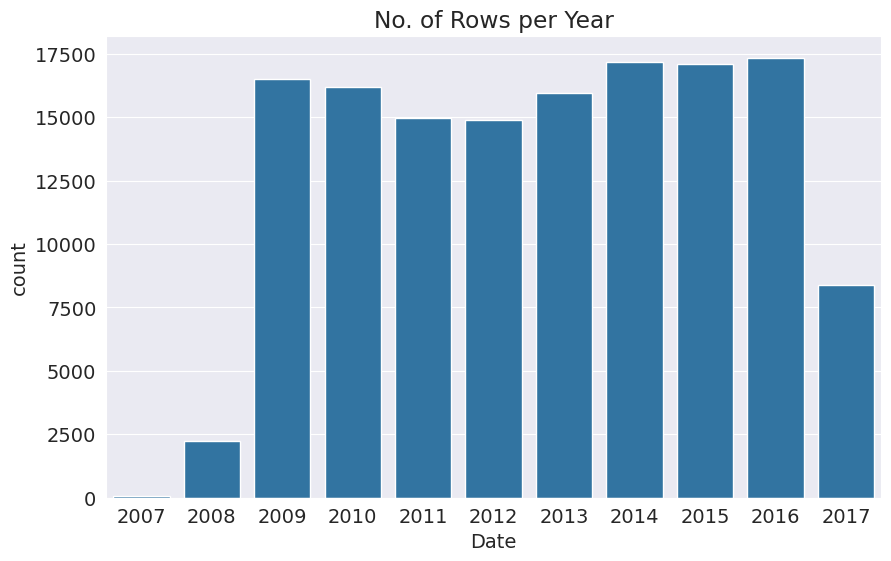

In [691]:
plt.title('No. of Rows per Year')
sns.countplot(x=pd.to_datetime(df_weather.Date).dt.year);

In [692]:
#Lets split the data based on year
import datetime as dt

Year = pd.to_datetime(df_weather.Date).dt.year

train_df = df_weather[Year < 2015]
val_df = df_weather[Year == 2015]
test_df = df_weather[Year > 2015]

In [693]:
print(train_df.shape)
print(val_df.shape)
print(test_df.shape)

(97988, 23)
(17089, 23)
(25710, 23)


In [694]:
#Lets separate the input and target columns
input_cols = list(train_df.columns)[1:-1]
target_cols = "RainTomorrow"

In [695]:
print(input_cols)

['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday']


In [696]:
print(target_cols)

RainTomorrow


In [697]:
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_cols].copy()

In [698]:
val_inputs = val_df[input_cols].copy()
val_targets = val_df[target_cols].copy()

In [699]:
test_inputs = test_df[input_cols].copy()
test_targets = test_df[target_cols].copy()

In [700]:
train_inputs.Location.unique()

array(['Albury', 'BadgerysCreek', 'Cobar', 'CoffsHarbour', 'Moree',
       'Newcastle', 'NorahHead', 'NorfolkIsland', 'Penrith', 'Richmond',
       'Sydney', 'SydneyAirport', 'WaggaWagga', 'Williamtown',
       'Wollongong', 'Canberra', 'Tuggeranong', 'MountGinini', 'Ballarat',
       'Bendigo', 'Sale', 'MelbourneAirport', 'Melbourne', 'Mildura',
       'Nhil', 'Portland', 'Watsonia', 'Dartmoor', 'Brisbane', 'Cairns',
       'GoldCoast', 'Townsville', 'Adelaide', 'MountGambier', 'Nuriootpa',
       'Woomera', 'Albany', 'Witchcliffe', 'PearceRAAF', 'PerthAirport',
       'Perth', 'SalmonGums', 'Walpole', 'Hobart', 'Launceston',
       'AliceSprings', 'Darwin', 'Katherine', 'Uluru'], dtype=object)

Let's also identify which of the columns are numerical and which ones are categorical. This will be useful later, as we'll need to convert the categorical data to numbers for training a logistic regression model.

In [703]:
#Lets identify the numeric and categorical columns
import numpy as np
numerical_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()
categorical_cols = train_inputs.select_dtypes('object').columns.tolist()

In [704]:
train_inputs[numerical_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,97674.000000,97801.000000,97988.000000,61657.000000,57942.000000,91160.000000,97114.000000,96919.000000,96936.000000,96872.000000,88876.000000,88857.000000,63000.000000,61966.000000,97414.000000,97392.000000
mean,12.007831,23.022202,2.372935,5.289991,7.609004,40.215873,14.092263,18.764608,68.628745,51.469547,1017.513734,1015.132352,4.302952,4.410677,16.835126,21.540138
std,6.347175,6.984397,8.518819,3.952010,3.788813,13.697967,8.984203,8.872398,19.003097,20.756113,7.072510,6.997072,2.866634,2.693370,6.404586,6.831612
min,-8.500000,-4.100000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,979.000000,0.000000,0.000000,-5.900000,-5.100000
25%,7.500000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.800000,1010.400000,1.000000,2.000000,12.200000,16.600000
50%,11.800000,22.400000,0.000000,4.600000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.500000,1015.100000,5.000000,5.000000,16.600000,20.900000
75%,16.600000,27.900000,0.800000,7.200000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.300000,1019.900000,7.000000,7.000000,21.400000,26.200000
max,33.900000,48.100000,371.000000,82.400000,14.300000,135.000000,87.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.100000


In [705]:
train_inputs[categorical_cols].isna().sum()

Location          0
WindGustDir    6868
WindDir9am     7019
WindDir3pm     1952
RainToday         0
dtype: int64

**Dealing with missing Values in numeric columns**

In [708]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='mean')

In [709]:
train_inputs[numerical_cols].isna().sum()

MinTemp            314
MaxTemp            187
Rainfall             0
Evaporation      36331
Sunshine         40046
WindGustSpeed     6828
WindSpeed9am       874
WindSpeed3pm      1069
Humidity9am       1052
Humidity3pm       1116
Pressure9am       9112
Pressure3pm       9131
Cloud9am         34988
Cloud3pm         36022
Temp9am            574
Temp3pm            596
dtype: int64

In [710]:
imputer.fit(df_weather[numerical_cols])

SimpleImputer()

In [711]:
list(imputer.statistics_)

[12.18482386562048,
 23.235120301822324,
 2.349974074310839,
 5.472515506887154,
 7.630539861047281,
 39.97051988882308,
 13.990496092519967,
 18.631140782316862,
 68.82683277087672,
 51.44928834695453,
 1017.6545771543717,
 1015.2579625879797,
 4.431160817585808,
 4.499250233195188,
 16.98706638787991,
 21.69318269001107]

In [712]:
train_inputs[numerical_cols] = imputer.transform(train_inputs[numerical_cols])
val_inputs[numerical_cols] = imputer.transform(val_inputs[numerical_cols])
test_inputs[numerical_cols] = imputer.transform(test_inputs[numerical_cols])

In [713]:
df_weather[numerical_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,140319.000000,140480.00000,140787.000000,81093.000000,73982.000000,131682.000000,139732.000000,138256.000000,139270.000000,137286.000000,127044.000000,127018.000000,88162.000000,84693.000000,140131.000000,138163.000000
mean,12.184824,23.23512,2.349974,5.472516,7.630540,39.970520,13.990496,18.631141,68.826833,51.449288,1017.654577,1015.257963,4.431161,4.499250,16.987066,21.693183
std,6.403879,7.11450,8.465173,4.189132,3.781729,13.578201,8.886210,8.798096,19.063650,20.807310,7.104867,7.035411,2.886594,2.719752,6.496012,6.937784
min,-8.500000,-4.80000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000
25%,7.600000,17.90000,0.000000,2.600000,4.900000,31.000000,7.000000,13.000000,57.000000,37.000000,1013.000000,1010.400000,1.000000,2.000000,12.300000,16.600000
50%,12.000000,22.60000,0.000000,4.800000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000
75%,16.800000,28.30000,0.800000,7.400000,10.700000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.400000
max,33.900000,48.10000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000


**Scaling Numeric Features**

Another good practice is to scale numeric features to a small range of values e.g. 
(
0
,
1
)
(0,1) or 
(
−
1
,
1
)
(−1,1). Scaling numeric features ensures that no particular feature has a disproportionate impact on the model's loss. Optimization algorithms also work better in practice with smaller numbers.

In [715]:
from sklearn.preprocessing import MinMaxScaler

In [717]:
scaler = MinMaxScaler()
scaler.fit(df_weather[numerical_cols])

MinMaxScaler()

In [718]:
print("Min")
scaler.data_min_

Min


array([ -8.5,  -4.8,   0. ,   0. ,   0. ,   6. ,   0. ,   0. ,   0. ,
         0. , 980.5, 977.1,   0. ,   0. ,  -7.2,  -5.4])

In [719]:
print("Max")
scaler.data_max_

Max


array([  33.9,   48.1,  371. ,  145. ,   14.5,  135. ,  130. ,   87. ,
        100. ,  100. , 1041. , 1039.6,    9. ,    9. ,   40.2,   46.7])

In [720]:
train_inputs[numerical_cols] = scaler.transform(train_inputs[numerical_cols])
val_inputs[numerical_cols] = scaler.transform(val_inputs[numerical_cols])
test_inputs[numerical_cols] = scaler.transform(test_inputs[numerical_cols])

In [721]:
train_inputs[numerical_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000
mean,0.483689,0.525947,0.006396,0.036949,0.525366,0.265107,0.108395,0.215668,0.686309,0.514693,0.612014,0.608705,0.483192,0.493693,0.507089,0.517103
std,0.149458,0.131904,0.022962,0.021628,0.200931,0.102420,0.068800,0.101424,0.189008,0.206376,0.111335,0.106611,0.255486,0.238028,0.134722,0.130726
min,0.000000,0.013233,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.030400,0.000000,0.000000,0.027426,0.005758
25%,0.377358,0.429112,0.000000,0.026207,0.517241,0.193798,0.053846,0.149425,0.570000,0.370000,0.543802,0.540800,0.333333,0.333333,0.409283,0.422265
50%,0.478774,0.514178,0.000000,0.037741,0.526244,0.255814,0.100000,0.218391,0.690000,0.520000,0.614125,0.610527,0.492351,0.499917,0.502110,0.506718
75%,0.591981,0.618147,0.002156,0.038621,0.634483,0.310078,0.146154,0.275862,0.830000,0.650000,0.682645,0.675200,0.666667,0.666667,0.601266,0.604607
max,1.000000,1.000000,1.000000,0.568276,0.986207,1.000000,0.669231,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.988484


**Encoding Categorical Data**

Since machine learning models can only be trained with numeric data, we need to convert categorical data to numbers. A common technique is to use one-hot encoding for categorical columns.

In [723]:
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')

In [724]:
encoder.fit(df_weather[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse_output=False)

In [725]:
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))


In [726]:
# Train set
encoded_train = pd.DataFrame(encoder.transform(train_inputs[categorical_cols]), columns=encoder.get_feature_names_out(categorical_cols), index=train_inputs.index) # Preserve index
train_inputs = pd.concat([train_inputs, encoded_train], axis=1)
# train_inputs = train_inputs.drop(columns=categorical_cols) # Drop original categorical cols

# Validation set
encoded_val = pd.DataFrame(encoder.transform(val_inputs[categorical_cols]), columns=encoder.get_feature_names_out(categorical_cols), index=val_inputs.index) # Preserve index
val_inputs = pd.concat([val_inputs, encoded_val], axis=1)
# val_inputs = val_inputs.drop(columns=categorical_cols) # Drop original categorical cols

# Test set
encoded_test = pd.DataFrame(encoder.transform(test_inputs[categorical_cols]), columns=encoder.get_feature_names_out(categorical_cols), index=test_inputs.index) # Preserve index
test_inputs = pd.concat([test_inputs, encoded_test], axis=1)
# test_inputs = test_inputs.drop(columns=categorical_cols) # Drop original categorical cols


In [727]:
pd.set_option('display.max_columns', None)

In [728]:
test_inputs

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindGustDir_nan,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir9am_nan,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,WindDir3pm_nan,RainToday_No,RainToday_Yes
2498,Albury,0.681604,0.801512,0.000000,0.037741,0.526244,ENE,0.372093,NaN,ESE,0.000000,0.080460,0.46,0.17,0.543802,0.5136,0.777778,0.333333,0.702532,0.808061,No,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2499,Albury,0.693396,0.725898,0.001078,0.037741,0.526244,SSE,0.341085,SSE,SE,0.069231,0.195402,0.54,0.30,0.505785,0.5008,0.888889,0.888889,0.675105,0.712092,No,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2500,Albury,0.634434,0.527410,0.005930,0.037741,0.526244,ENE,0.325581,ESE,ENE,0.084615,0.448276,0.62,0.67,0.553719,0.6032,0.888889,0.888889,0.611814,0.477927,Yes,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2501,Albury,0.608491,0.538752,0.042049,0.037741,0.526244,SSE,0.255814,SE,SSE,0.069231,0.195402,0.74,0.65,0.618182,0.6304,0.888889,0.888889,0.556962,0.518234,Yes,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

**Saving Processed Data to Disk**
    
It can be useful to save processed data to disk, especially for really large datasets, to avoid repeating the preprocessing steps every time you start the Jupyter notebook. The parquet format is a fast and efficient format for saving and loading Pandas dataframes.

In [731]:
print('train_inputs:', train_inputs.shape)
print('train_targets:', train_targets.shape)
print('val_inputs:', val_inputs.shape)
print('val_targets:', val_targets.shape)
print('test_inputs:', test_inputs.shape)
print('test_targets:', test_targets.shape)

train_inputs: (97988, 123)
train_targets: (97988,)
val_inputs: (17089, 123)
val_targets: (17089,)
test_inputs: (25710, 123)
test_targets: (25710,)


In [732]:
%%time
train_inputs.to_parquet('train_inputs.parquet')
val_inputs.to_parquet('val_inputs.parquet')
test_inputs.to_parquet('test_inputs.parquet')

pd.DataFrame(train_targets).to_parquet('train_targets.parquet')
pd.DataFrame(val_targets).to_parquet('val_targets.parquet')
pd.DataFrame(test_targets).to_parquet('test_targets.parquet')

CPU times: user 1.05 s, sys: 49 ms, total: 1.1 s
Wall time: 954 ms


We can read the data back using `pd.read_parquet.`



In [736]:
# %%time
# train_inputs = pd.read_parquet('train_inputs.parquet')
# val_inputs = pd.read_parquet('val_inputs.parquet')
# test_inputs = pd.read_parquet('test_inputs.parquet')

# train_targets = pd.read_parquet('train_targets.parquet')[target_col]
# val_targets = pd.read_parquet('val_targets.parquet')[target_col]
# test_targets = pd.read_parquet('test_targets.parquet')[target_col]

In [747]:
print('train_inputs:', train_inputs.shape)
print('train_targets:', train_targets.shape)
print('val_inputs:', val_inputs.shape)
print('val_targets:', val_targets.shape)
print('test_inputs:', test_inputs.shape)
print('test_targets:', test_targets.shape)

train_inputs: (97988, 123)
train_targets: (97988,)
val_inputs: (17089, 123)
val_targets: (17089,)
test_inputs: (25710, 123)
test_targets: (25710,)


**Training a Logistic Regression Model**
    
Logistic regression is a commonly used technique for solving binary classification problems. In a logistic regression model:

* we take linear combination (or weighted sum of the input features)
* we apply the sigmoid function to the result to obtain a number between 0 and 1
* this number represents the probability of the input being classified as "Yes"
* instead of RMSE, the cross entropy loss function is used to evaluate the results

In [786]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(solver='liblinear').fit(train_inputs[numerical_cols + encoded_cols],train_targets)

model

LogisticRegression(solver='liblinear')

In [788]:
print(numerical_cols + encoded_cols)

['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Location_Adelaide', 'Location_Albany', 'Location_Albury', 'Location_AliceSprings', 'Location_BadgerysCreek', 'Location_Ballarat', 'Location_Bendigo', 'Location_Brisbane', 'Location_Cairns', 'Location_Canberra', 'Location_Cobar', 'Location_CoffsHarbour', 'Location_Dartmoor', 'Location_Darwin', 'Location_GoldCoast', 'Location_Hobart', 'Location_Katherine', 'Location_Launceston', 'Location_Melbourne', 'Location_MelbourneAirport', 'Location_Mildura', 'Location_Moree', 'Location_MountGambier', 'Location_MountGinini', 'Location_Newcastle', 'Location_Nhil', 'Location_NorahHead', 'Location_NorfolkIsland', 'Location_Nuriootpa', 'Location_PearceRAAF', 'Location_Penrith', 'Location_Perth', 'Location_PerthAirport', 'Location_Portland', 'Location_Richmond', 'Location_Sale', 'Location_

**Making Predictions and Evaluating the Model**

In [793]:
X_train = train_inputs[numerical_cols + encoded_cols]
X_val = val_inputs[numerical_cols + encoded_cols]
X_test = test_inputs[numerical_cols + encoded_cols]

In [795]:
train_preds = model.predict(X_train)

In [797]:
train_preds

array(['No', 'No', 'No', ..., 'No', 'No', 'No'], dtype=object)

In [799]:
train_targets

0         No
1         No
2         No
3         No
4         No
          ..
144548    No
144549    No
144550    No
144551    No
144552    No
Name: RainTomorrow, Length: 97988, dtype: object

In [801]:
train_probs = model.predict_proba(X_train)
train_probs

array([[0.94401061, 0.05598939],
       [0.9407409 , 0.0592591 ],
       [0.96093574, 0.03906426],
       ...,
       [0.98749098, 0.01250902],
       [0.98334658, 0.01665342],
       [0.87453283, 0.12546717]])

In [807]:
from sklearn.metrics import accuracy_score

accuracy_score(train_targets, train_preds)

0.8519206433440829

In [809]:
from sklearn.metrics import confusion_matrix
confusion_matrix(train_targets, train_preds, normalize='true')


array([[0.94621341, 0.05378659],
       [0.4776585 , 0.5223415 ]])

In [811]:
def predict_and_plot(inputs, targets, name=''):
    preds = model.predict(inputs)
    
    accuracy = accuracy_score(targets, preds)
    print("Accuracy: {:.2f}%".format(accuracy * 100))
    
    cf = confusion_matrix(targets, preds, normalize='true')
    plt.figure()
    sns.heatmap(cf, annot=True)
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.title('{} Confusion Matrix'.format(name));
    
    return preds

Accuracy: 85.19%


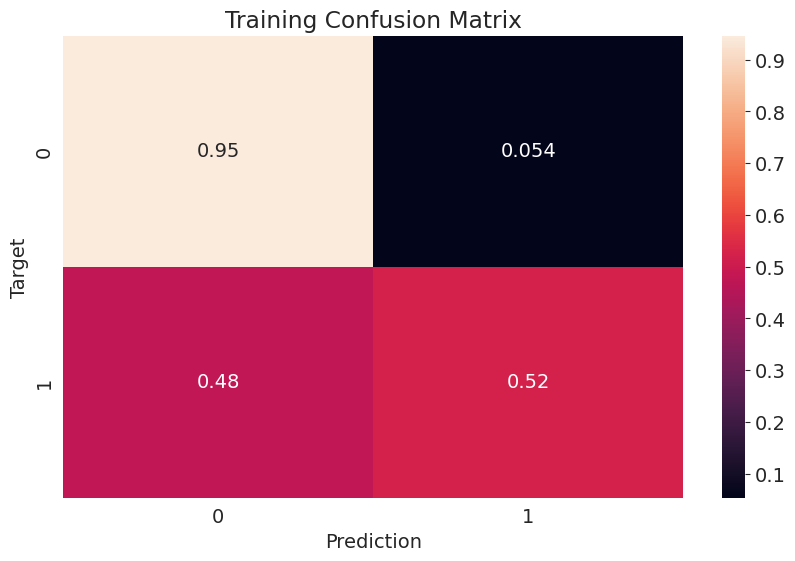

In [813]:
train_preds = predict_and_plot(X_train, train_targets, 'Training')


Accuracy: 85.40%


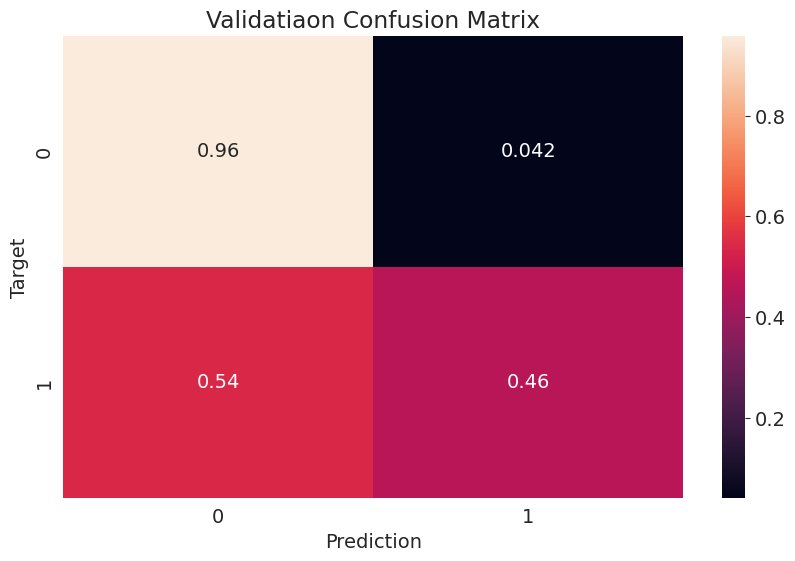

In [815]:
val_preds = predict_and_plot(X_val, val_targets, 'Validatiaon')


Accuracy: 84.20%


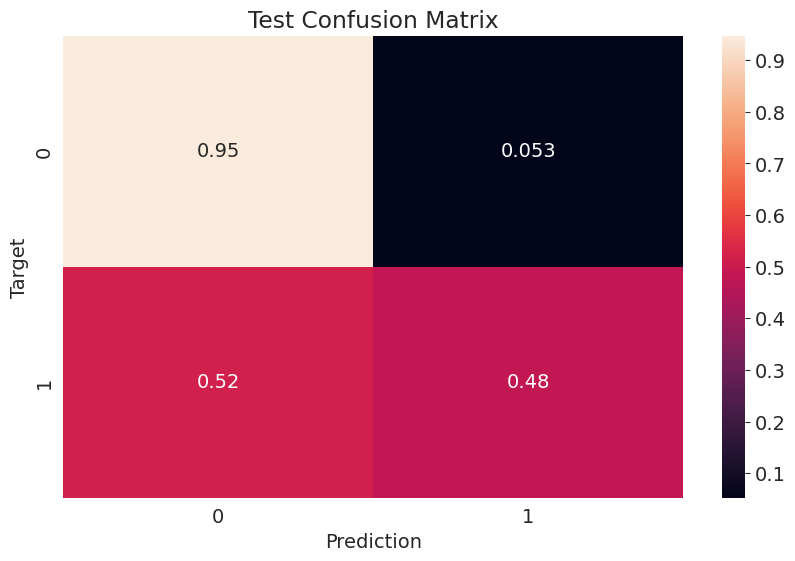

In [817]:
test_preds = predict_and_plot(X_test, test_targets, 'Test')


The accuracy of the model on the test and validation set are above 84%, which suggests that our model generalizes well to data it hasn't seen before.

But how good is 84% accuracy? While this depends on the nature of the problem and on business requirements, a good way to verify whether a model has actually learned something useful is to compare its results to a "random" or "dumb" model.

Let's create two models: one that guesses randomly and another that always return "No". Both of these models completely ignore the inputs given to them.

In [821]:
def random_guess(inputs):
    return np.random.choice(["No", "Yes"], len(inputs))

In [823]:
def all_no(inputs):
    return np.full(len(inputs), "No")

In [825]:
accuracy_score(test_targets, random_guess(X_test))


0.49684947491248543

In [827]:
accuracy_score(test_targets, all_no(X_test))


0.7734344612991054

**Making Predictions on a Single Input**
    
Once the model has been trained to a satisfactory accuracy, it can be used to make predictions on new data. Consider the following dictionary containing data collected from the Katherine weather department today.

In [830]:
new_input = {'Date': '2021-06-19',
             'Location': 'Katherine',
             'MinTemp': 23.2,
             'MaxTemp': 33.2,
             'Rainfall': 10.2,
             'Evaporation': 4.2,
             'Sunshine': np.nan,
             'WindGustDir': 'NNW',
             'WindGustSpeed': 52.0,
             'WindDir9am': 'NW',
             'WindDir3pm': 'NNE',
             'WindSpeed9am': 13.0,
             'WindSpeed3pm': 20.0,
             'Humidity9am': 89.0,
             'Humidity3pm': 58.0,
             'Pressure9am': 1004.8,
             'Pressure3pm': 1001.5,
             'Cloud9am': 8.0,
             'Cloud3pm': 5.0,
             'Temp9am': 25.7,
             'Temp3pm': 33.0,
             'RainToday': 'Yes'}

In [832]:
new_input_df = pd.DataFrame([new_input])
new_input_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,2021-06-19,Katherine,23.2,33.2,10.2,4.2,NaN,NNW,52.0,NW,NNE,13.0,20.0,89.0,58.0,1004.8,1001.5,8.0,5.0,25.7,33.0,Yes


In [836]:
new_input_df[numerical_cols] = imputer.transform(new_input_df[numerical_cols])
new_input_df[numerical_cols] = scaler.transform(new_input_df[numerical_cols])
new_input_df[encoded_cols] = encoder.transform(new_input_df[categorical_cols])

/tmp/ipykernel_4964/2785338023.py:3: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_4964/2785338023.py:3: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_4964/2785338023.py:3: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_4964/2785338023.py:3: PerformanceWarn

In [840]:
X_new_input = new_input_df[numerical_cols + encoded_cols]
X_new_input

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindGustDir_nan,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir9am_nan,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,WindDir3pm_nan,RainToday_No,RainToday_Yes
0,0.747642,0.718336,0.027493,0.028966,0.526244,0.356589,0.1,0.229885,0.89,0.58,0.401653,0.3904,0.888889,0.555556,0.694093,0.737044,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [842]:
prediction = model.predict(X_new_input)[0]
prediction

'Yes'

In [844]:
prob = model.predict_proba(X_new_input)[0]
prob

array([0.48102288, 0.51897712])

Let's define a helper function to make predictions for individual inputs.

In [856]:
def predict_input(single_input):
    input_df = pd.DataFrame([single_input])
    input_df[numerical_cols] = imputer.transform(input_df[numerical_cols])
    input_df[numerical_cols] = scaler.transform(input_df[numerical_cols])
    input_df[encoded_cols] = encoder.transform(input_df[categorical_cols])
    X_input = input_df[numerical_cols + encoded_cols]
    pred = model.predict(X_input)[0]
    prob = model.predict_proba(X_input)[0][list(model.classes_).index(pred)]
    return pred, prob

In [858]:
new_input = {'Date': '2021-06-19',
             'Location': 'Launceston',
             'MinTemp': 23.2,
             'MaxTemp': 33.2,
             'Rainfall': 10.2,
             'Evaporation': 4.2,
             'Sunshine': np.nan,
             'WindGustDir': 'NNW',
             'WindGustSpeed': 52.0,
             'WindDir9am': 'NW',
             'WindDir3pm': 'NNE',
             'WindSpeed9am': 13.0,
             'WindSpeed3pm': 20.0,
             'Humidity9am': 89.0,
             'Humidity3pm': 58.0,
             'Pressure9am': 1004.8,
             'Pressure3pm': 1001.5,
             'Cloud9am': 8.0,
             'Cloud3pm': 5.0,
             'Temp9am': 25.7,
             'Temp3pm': 33.0,
             'RainToday': 'Yes'}

In [860]:
predict_input(new_input)


/tmp/ipykernel_4964/2363771375.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_4964/2363771375.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_4964/2363771375.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_4964/2363771375.py:5: PerformanceWarn

('Yes', 0.6474987962997906)

**Saving and Loading Trained Models**
    
We can save the parameters (weights and biases) of our trained model to disk, so that we needn't retrain the model from scratch each time we wish to use it. Along with the model, it's also important to save imputers, scalers, encoders and even column names. Anything that will be required while generating predictions using the model should be saved.

We can use the joblib module to save and load Python objects on the disk.



In [865]:
import joblib

In [871]:
aussie_rain = {
    'model': model,
    'imputer': imputer,
    'scaler': scaler,
    'encoder': encoder,
    'input_cols': input_cols,
    'numerical_cols': numerical_cols,
    'categorical_cols': categorical_cols,
    'encoded_cols': encoded_cols
}

In [873]:
joblib.dump(aussie_rain, 'aussie_rain.joblib')

['aussie_rain.joblib']

The object can be loaded back using joblib.load



In [876]:
aussie_rain2 = joblib.load('aussie_rain.joblib')

In [878]:
test_preds2 = aussie_rain2['model'].predict(X_test)
accuracy_score(test_targets, test_preds2)

0.8420070011668611